# Single Cell RNAseq data of the TME of LUAD patients treated with TKI

Import packages

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import numpy as np

Plotting settings

In [2]:
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300, facecolor='white', color_map = 'viridis_r')
matplotlib.rcParams['font.sans-serif'] = "Arial"
sns.set(style="whitegrid", font_scale=1, color_codes=True, palette="colorblind", rc={"grid.linestyle": "dotted", "axes.linewidth": 0.6})

/home/marcc/.local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.3 scipy==1.9.1 pandas==1.5.0 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


## 1. Import scRNA data and meta annotations

In [3]:
X = pd.read_csv("/home/marcc/AXLomics/msresist/data/RNAseq/Maynard/S01_datafinal.csv").dropna(axis=0)
meta = pd.read_csv("/home/marcc/AXLomics/msresist/data/RNAseq/Maynard/S01_metacells.csv")
assert np.all(meta["cell_id"].values == X.columns.values[1:]) # assert cell ids match in data and meta

Select only cells pertaining to tumors driven by EGFR

In [4]:
d = X.copy().set_index("Unnamed: 0").T
d.insert(0, "driver_gene", meta["driver_gene"].values)
d = d[(d["driver_gene"] == "EGFR")].drop("driver_gene", axis=1)
meta = meta[(meta["driver_gene"] == "EGFR")] # select only EGFR-dependent cells

In [5]:
cca = pd.read_csv("/home/marcc/AXLomics/msresist/data/RNAseq/Maynard/cancer_cell_annotation.csv")
IDtoCNV = dict(zip(list(cca["cell_id"]), list(list(cca["inferCNV_annotation"]))))
meta.insert(3, "inferCNV_annotation", [IDtoCNV[c_id] if c_id in list(IDtoCNV.keys()) else "nonepithelial" for c_id in list(meta["cell_id"])])

Create scanpy anndata object and annotate with meta

In [10]:
adata = sc.AnnData(d.select_dtypes(include=[float]))
adata.obs = meta
adata.obs.index = adata.obs.index.astype(str)

/tmp/ipykernel_3325510/1767394892.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(d.select_dtypes(include=[float]))


Data dimensions and annotations available:

## 2. Filter and normalize data

In [11]:
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
adata = adata[adata.obs.total_counts > 50000, :]

Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.

/home/marcc/.local/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


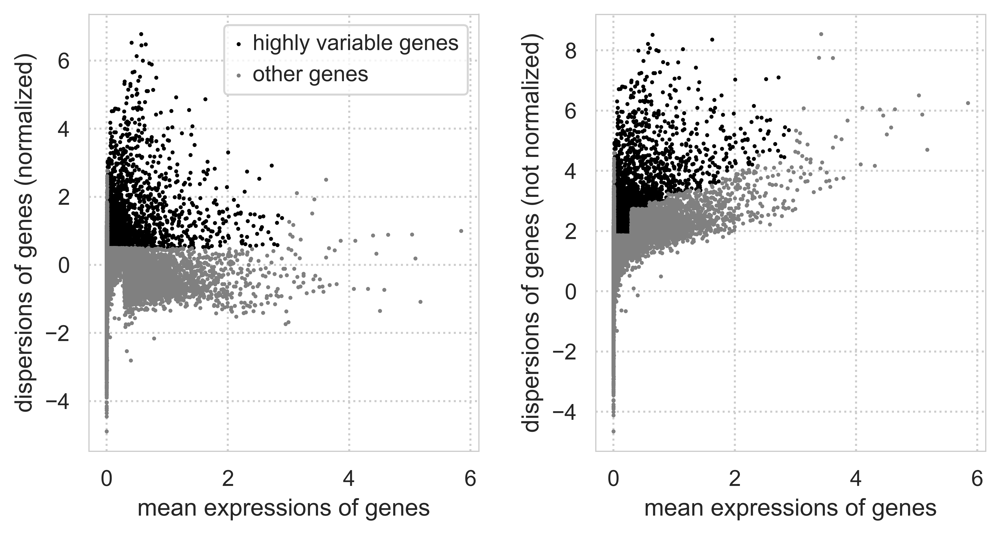

In [12]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
sc.pp.scale(adata, max_value=10)

Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

In [13]:
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)

/home/marcc/.local/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


## 3. Clustering of cell populations

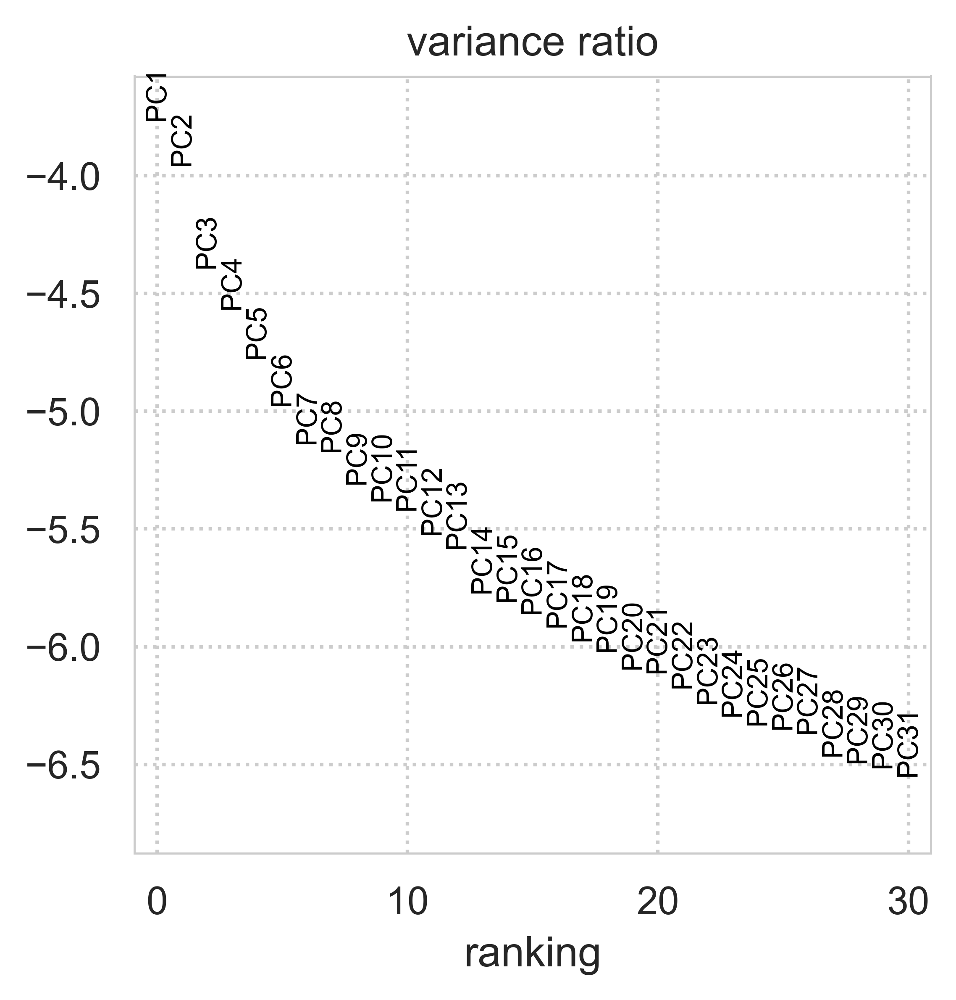

<Figure size 1200x1200 with 0 Axes>

In [14]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)
plt.savefig("PCAcomps.svg")

### 3.1 Computing neighborhood graph

/home/marcc/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


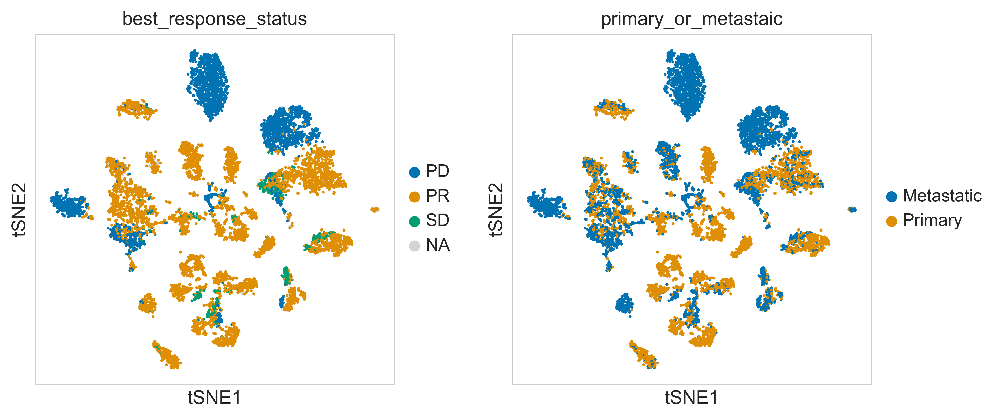

<Figure size 1200x1200 with 0 Axes>

In [15]:
sc.tl.pca(adata, svd_solver='arpack')
sc.tl.tsne(adata, n_pcs=20, perplexity=30)
sc.pl.tsne(adata, color=["best_response_status", "primary_or_metastaic"])
plt.savefig("tsne.svg")

Identification of clusters based on identified marker genes in Maynard et al

In [16]:
marker_genes_dict = {
    'Immune Cells': ['PTPRC', 'CD3G', 'CD3E', 'CD79A', 'BLNK', 'CD68', 'CSF1R', 'CD207'],
    'Endothelial': ['PECAM1', 'CD34'],
    'Epithelial': ['EPCAM', 'KRT19'],
    'Fibroblasts': ['ACTA2', 'MCAM', "MYLK", "MYL9", 'FAP'],
}

/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


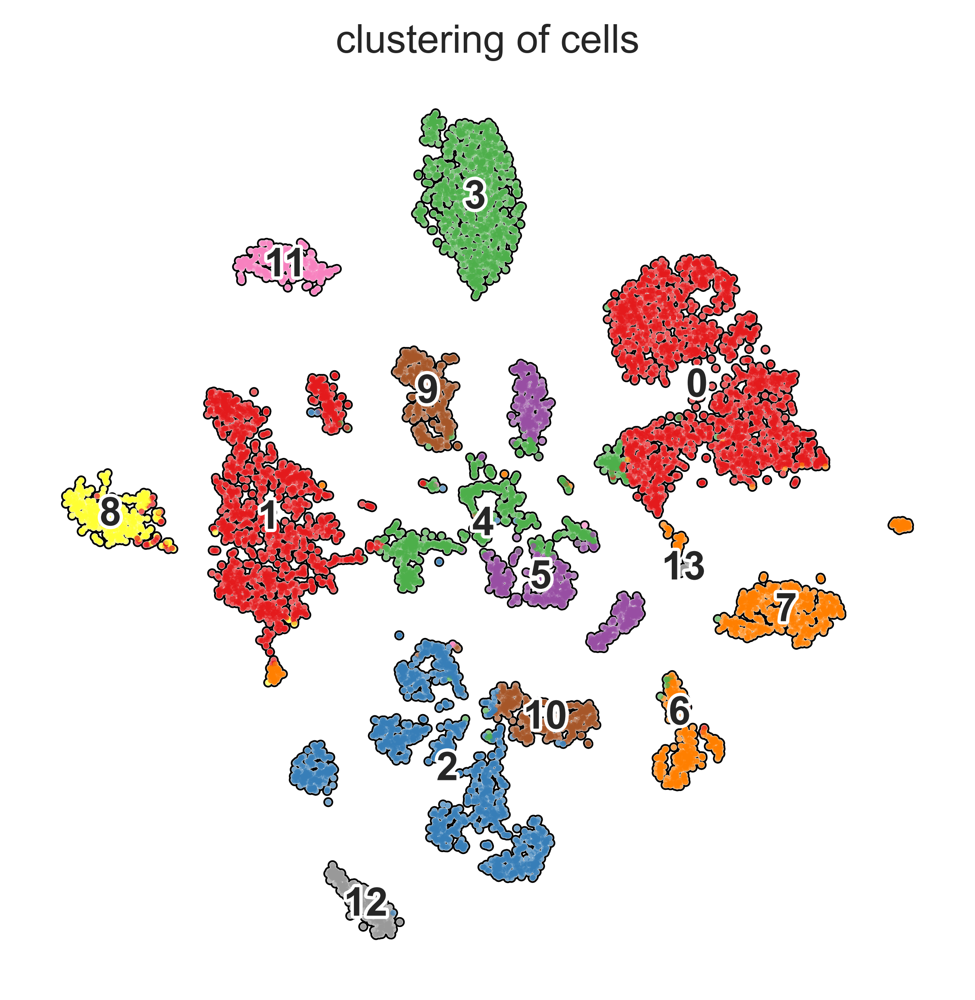

<Figure size 1200x1200 with 0 Axes>

In [17]:
# compute clusters using the leiden method and store the results with the name `clusters`
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10) #10
sc.tl.leiden(adata, key_added='clusters', resolution=0.2) #0.2
with plt.rc_context({'figure.figsize': (5, 5)}):
    sc.pl.tsne(adata, color='clusters', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')
plt.savefig("leiden_tsne.svg")

/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


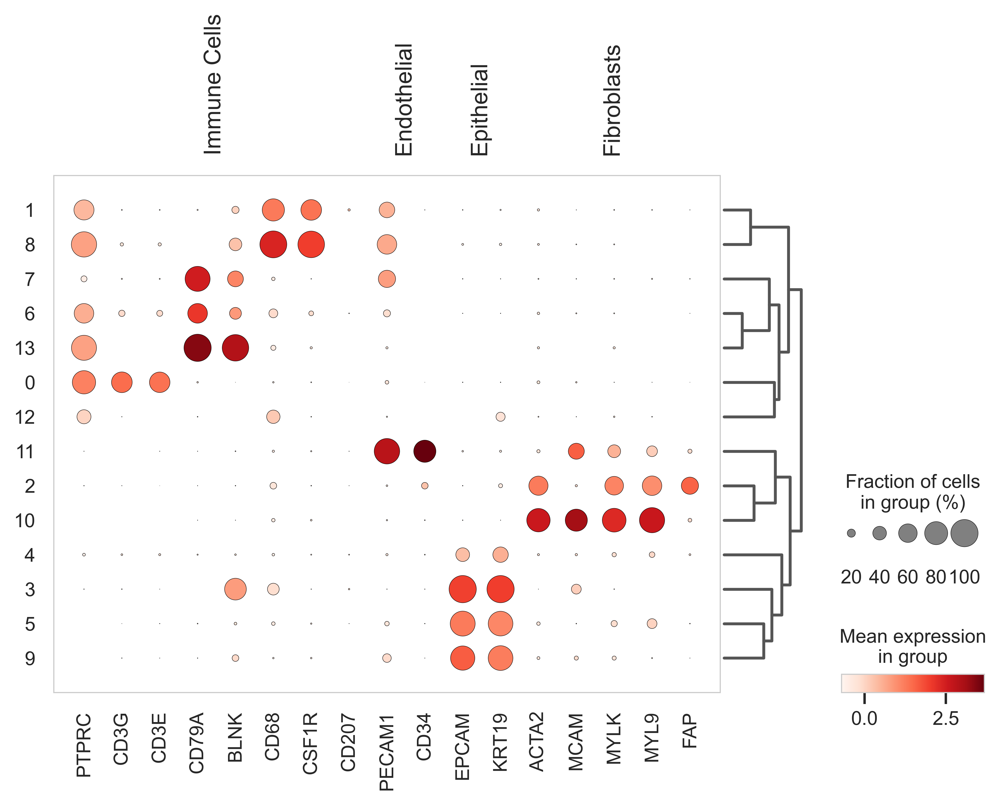

<Figure size 1200x1200 with 0 Axes>

In [18]:
sc.pl.dotplot(adata, marker_genes_dict, 'clusters', dendrogram=True)
plt.savefig("leiden_heatmap.svg")

In [19]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
     '0': 'Immune',
     '1': 'Immune',
     '2': 'Stromal',
     '3': 'Epithelial',
     '4': 'Epithelial',
     '5': 'Epithelial',
     '6': 'Immune',
     '7': 'Immune',
     '8': 'Immune',
     '9': 'Epithelial',
     '10': 'Stromal',
     '11': 'Stromal',
     '12': 'Immune',
     '13': 'Immune',
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs['cell type'] = adata.obs['clusters'].map(cluster2annotation).astype('category')

/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


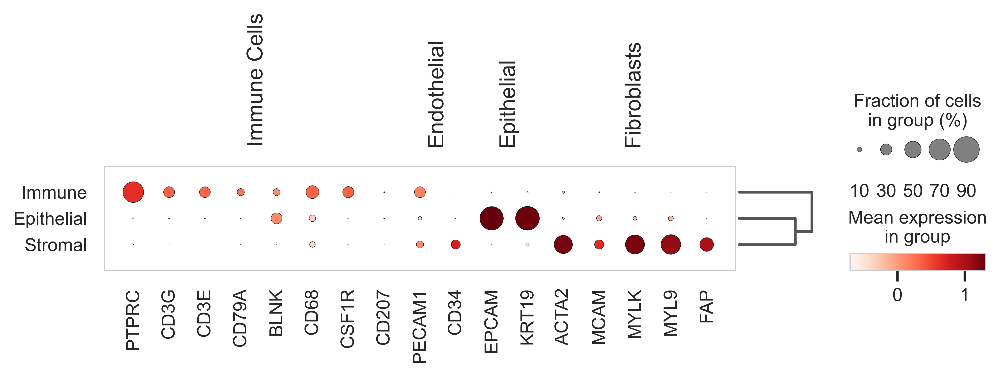

<Figure size 1200x1200 with 0 Axes>

In [20]:
sc.pl.dotplot(adata, marker_genes_dict, 'cell type', dendrogram=True)
plt.savefig("leiden_heatmap_final.svg")

/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


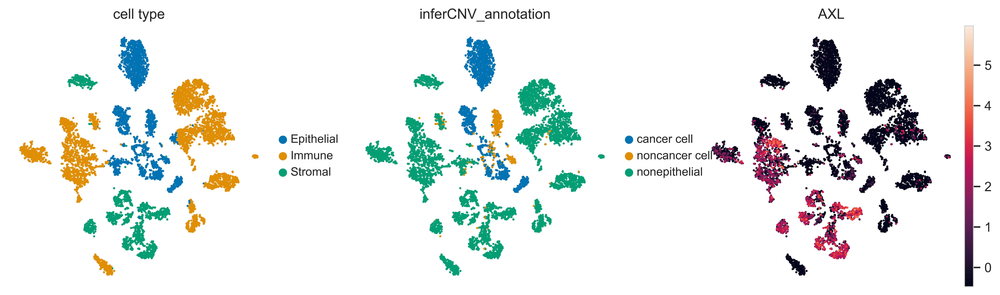

<Figure size 1200x1200 with 0 Axes>

In [21]:
sc.pl.tsne(adata, color=['cell type', "inferCNV_annotation", "AXL"],
           frameon=False, legend_fontsize=10, legend_fontoutline=2)
plt.savefig("tsne_annotated.svg")

### 4 Tumor analysis

/home/marcc/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


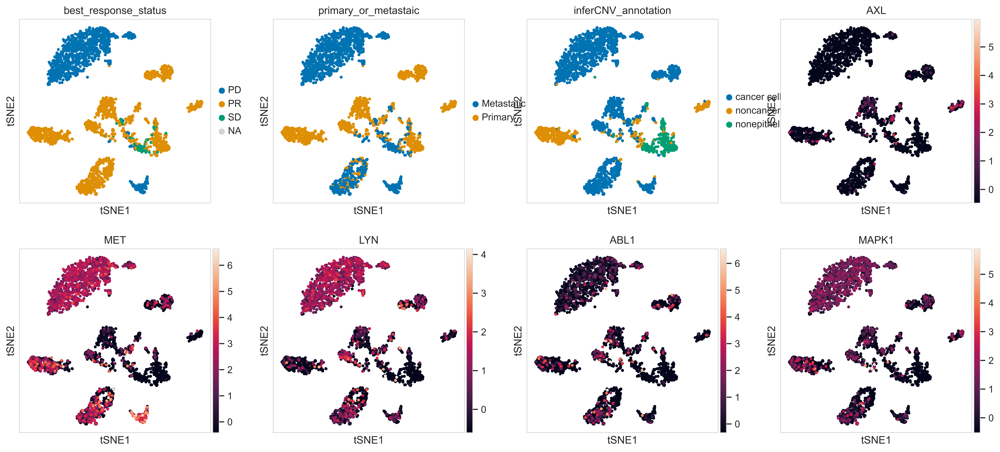

<Figure size 1200x1200 with 0 Axes>

In [22]:
TvsNAT = adata[(adata.obs["cell type"] == "Epithelial") & (adata.obs["inferCNV_annotation"] != "NA")]
sc.tl.pca(TvsNAT, svd_solver='arpack')
sc.tl.tsne(TvsNAT, n_pcs=10, perplexity=30)
sc.pl.tsne(TvsNAT, color=["best_response_status", "primary_or_metastaic", "inferCNV_annotation", "AXL", "MET", "LYN", "ABL1", "MAPK1"])
plt.savefig("TvsNAT.svg")

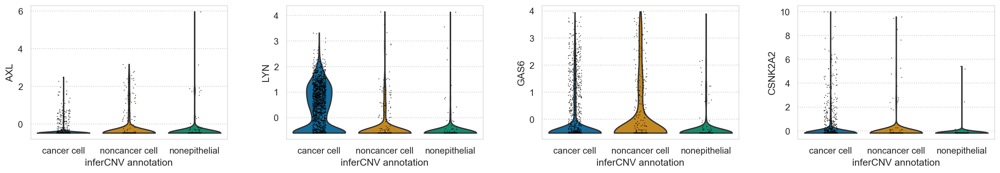

In [23]:
with plt.rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(TvsNAT, ['AXL', 'LYN', 'GAS6', 'CSNK2A2'], groupby='inferCNV_annotation')

/home/marcc/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marcc/.local/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


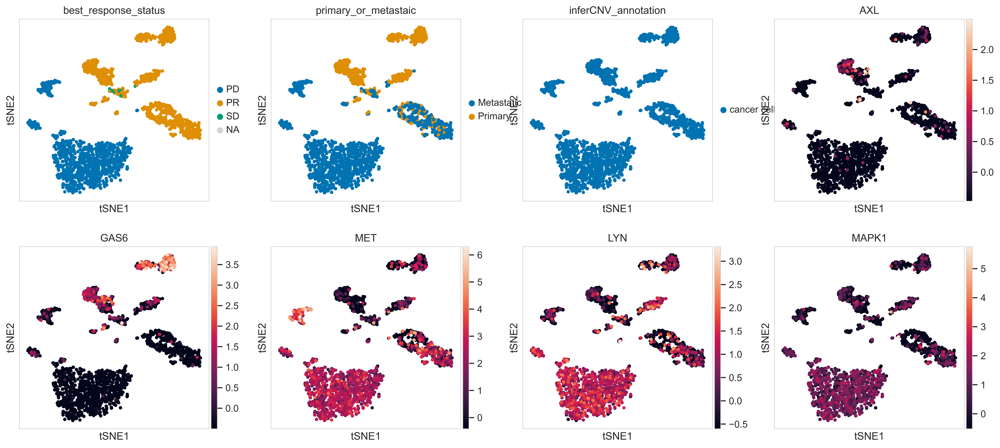

<Figure size 1200x1200 with 0 Axes>

In [24]:
cc = adata[(adata.obs["cell type"] == "Epithelial") & (adata.obs["inferCNV_annotation"] == "cancer cell")]
sc.tl.pca(cc, svd_solver='arpack')
sc.tl.tsne(cc, n_pcs=10, perplexity=30)
sc.pl.tsne(cc, color=["best_response_status", "primary_or_metastaic", "inferCNV_annotation", "AXL", "GAS6", "MET", "LYN", "MAPK1"])
plt.savefig("Cancer_tsne.svg")

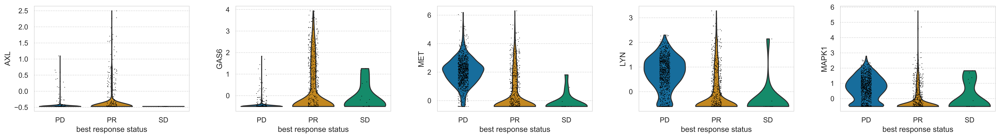

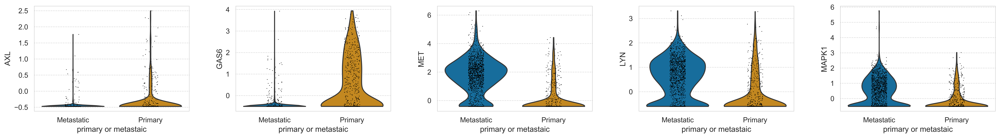

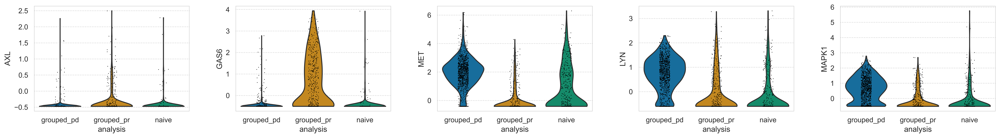

<Figure size 1200x1200 with 0 Axes>

In [25]:
with plt.rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(cc, ["AXL", "GAS6", "MET", "LYN", "MAPK1"], groupby='best_response_status')
    sc.pl.violin(cc, ["AXL", "GAS6", "MET", "LYN", "MAPK1"], groupby='primary_or_metastaic')
    sc.pl.violin(cc, ["AXL", "GAS6", "MET", "LYN", "MAPK1"], groupby='analysis')
plt.savefig("Cancer_tsne_violinplots.svg")